In [2]:
import copy

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def plot_figure(images: list, titles: list, rows: int, columns: int, fig_width=15, fig_height=7):
    fig = plt.figure(figsize=(fig_width, fig_height))
    count = 1
    for image, title in zip(images, titles):
        fig.add_subplot(rows, columns, count)
        count += 1

        if "Histogram" in title:
            plt.plot(image, color='b')
            plt.axis('on')
        else:
            plt.imshow(image, cmap='gray')
            plt.axis('off')
        
        plt.title(title)

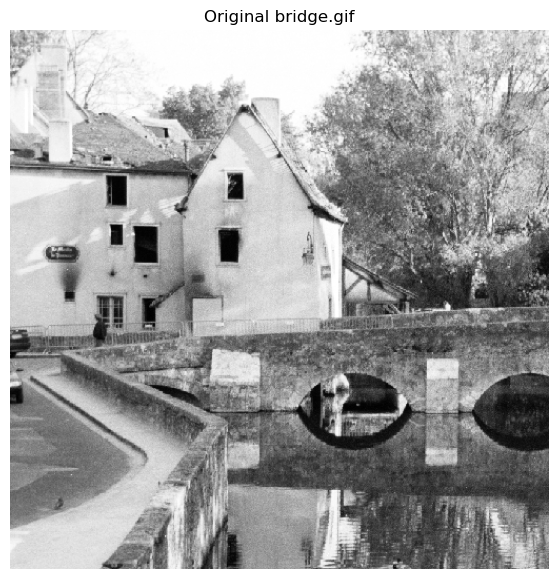

In [3]:
image_name = "bridge.gif"
image = np.array(Image.open(image_name))
plot_figure([image], [f'Original {image_name}'], 1, 1)

# question 1 a

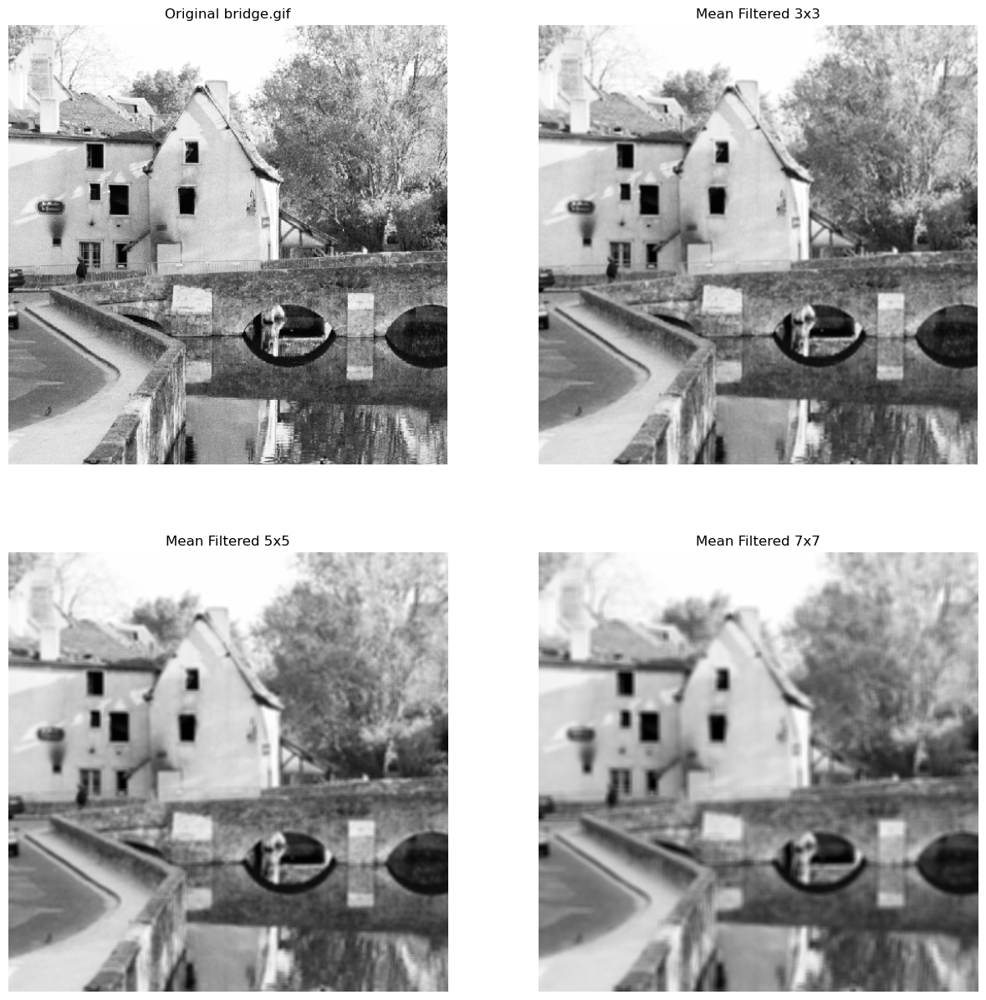

In [4]:
mask_3x3 = np.ones((3, 3))/9
mask_5x5 = np.ones((5, 5))/25
mask_7x7 = np.ones((7, 7))/49

output_3x3 = cv2.filter2D(image, -1, mask_3x3)
output_5x5 = cv2.filter2D(image, -1, mask_5x5)
output_7x7 = cv2.filter2D(image, -1, mask_7x7)

plot_figure([image, output_3x3, output_5x5, output_7x7],
            [f'Original {image_name}', 'Mean Filtered 3x3', 'Mean Filtered 5x5', 'Mean Filtered 7x7'],
            2, 2, 15, 15)

# question 1 b

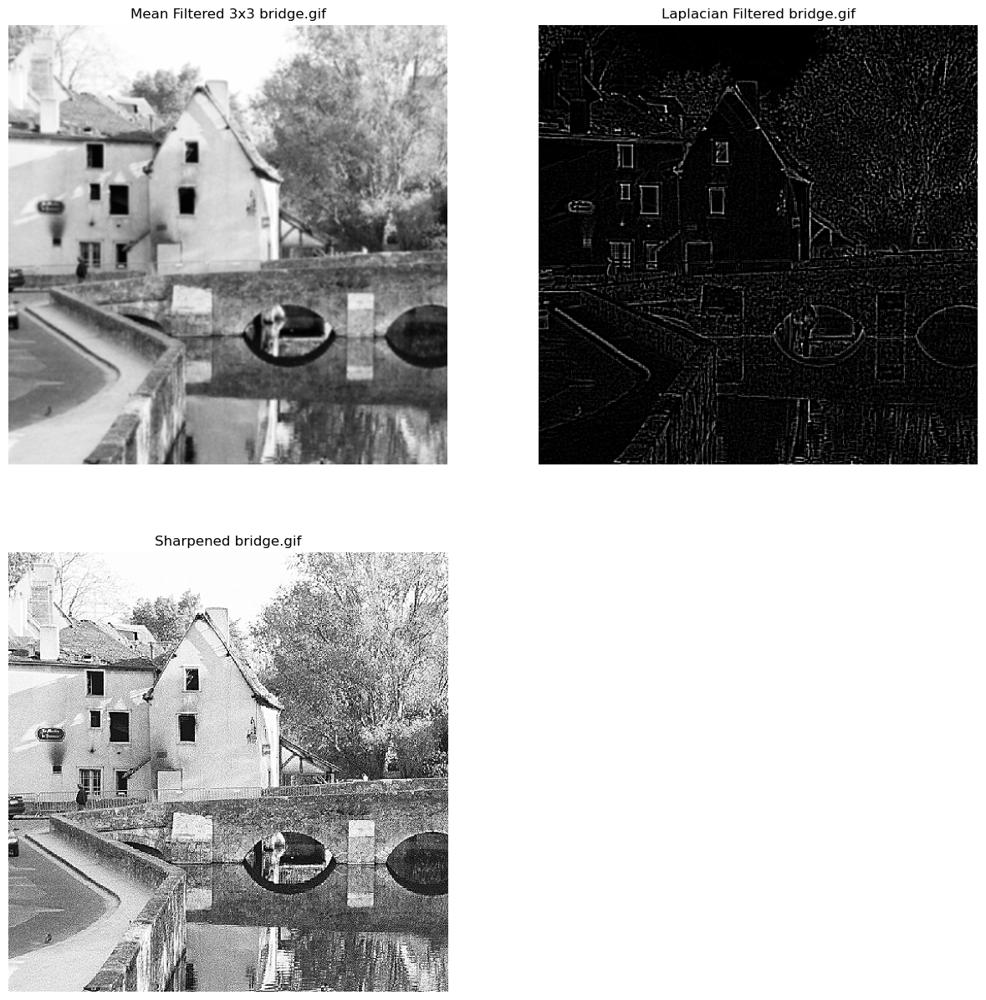

In [6]:
laplacian_mask = np.array(([0, -1, 0], [-1, 5, -1], [0, -1, 0]))
laplacian_filtered_image = cv2.Laplacian(output_3x3, -1, ksize=3)
sharpened_image = cv2.filter2D(image, -1, laplacian_mask)

plot_figure([output_3x3, laplacian_filtered_image, sharpened_image],
            [f'Mean Filtered 3x3 {image_name}', f'Laplacian Filtered {image_name}', f'Sharpened {image_name}'],
            2, 2, 15, 15)

# question 1 c

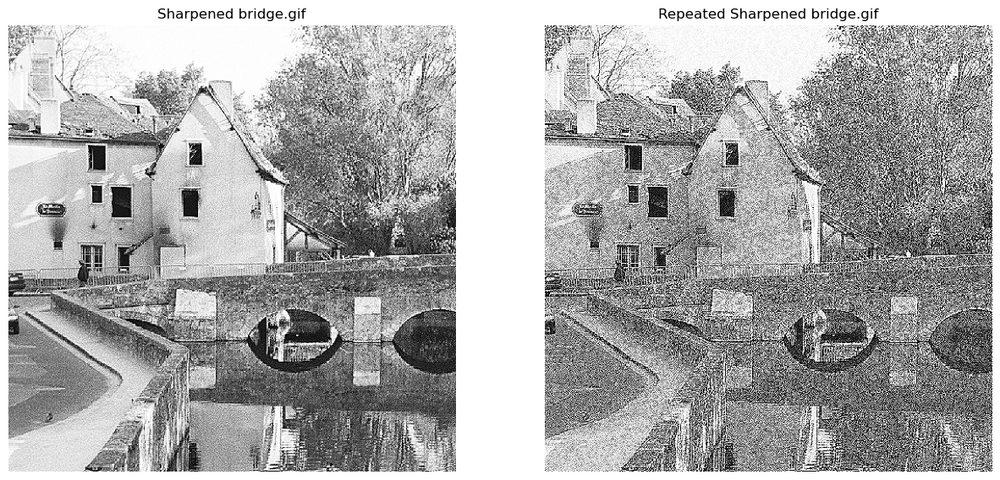

In [7]:
repeated_sharpened_image = cv2.filter2D(sharpened_image, -1, laplacian_mask)
plot_figure([sharpened_image, repeated_sharpened_image],
            [f'Sharpened {image_name}', f'Repeated Sharpened {image_name}'],
            1, 2)

# question 2 b


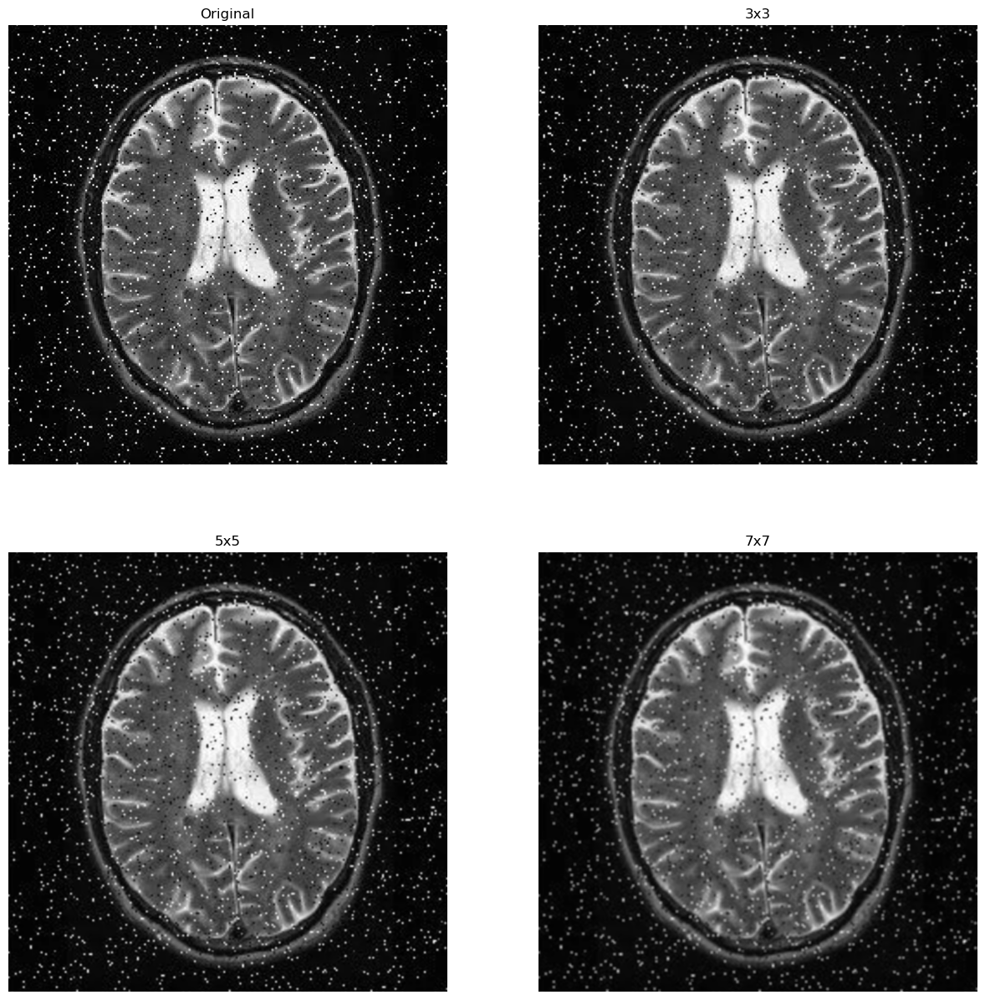

In [8]:
image = cv2.imread('brain.png', cv2.IMREAD_GRAYSCALE)

output_3x3 = cv2.blur(image, (3, 3))
output_5x5 = cv2.blur(image, (5, 5))
output_7x7 = cv2.blur(image, (7, 7))

plot_figure([image, output_3x3, output_5x5, output_7x7],
            [f'Original', '3x3', '5x5', '7x7'],
            2, 2, 15, 15)


# question 2 c

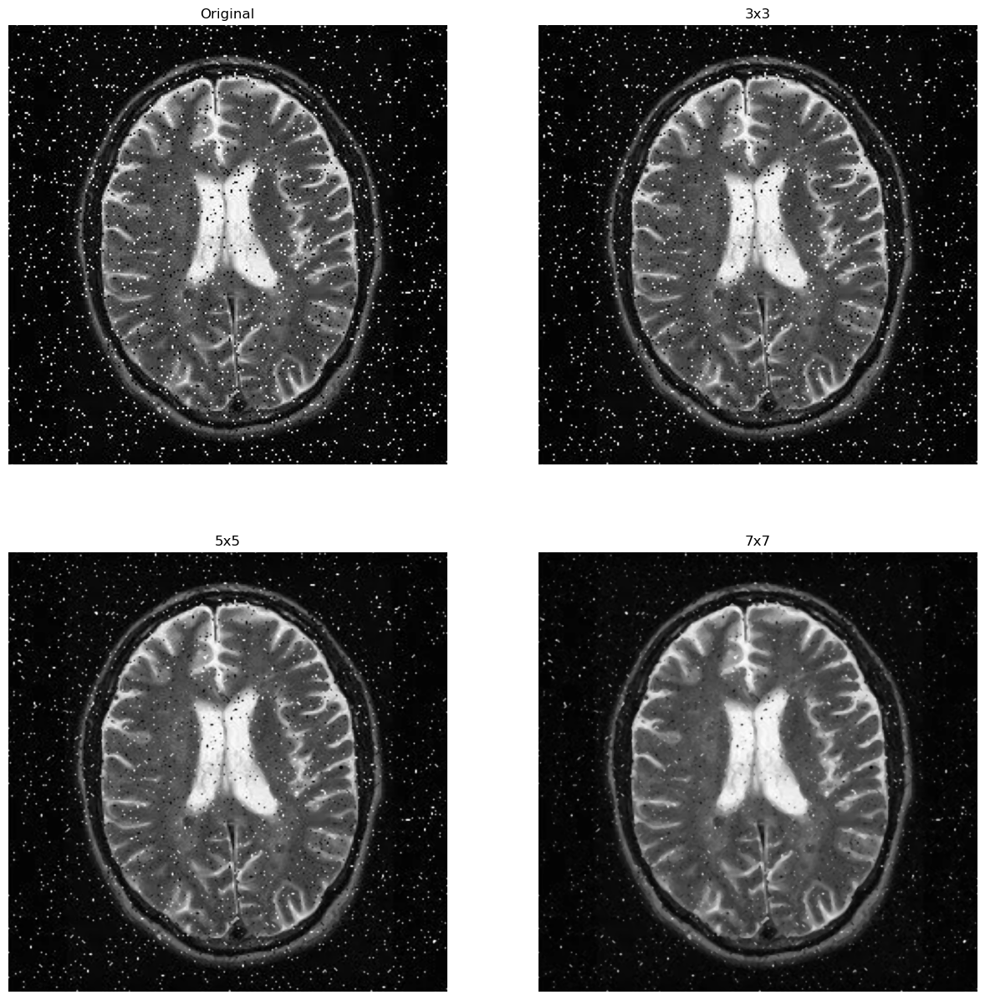

In [9]:
from PIL import Image
import numpy as np
from scipy.ndimage import median_filter
import matplotlib.pyplot as plt

# Load the image
image = Image.open("brain.png").convert("L")

# Convert the image to a NumPy array
image_array = np.array(image)

# Apply median filtering with a 3x3 kernel size
output_3x3 = median_filter(image_array, size=3)
output_5x5 = median_filter(image_array, size=5)
output_7x7 = median_filter(image_array, size=7)

plot_figure([image, output_3x3, output_5x5, output_7x7],
            [f'Original', '3x3', '5x5', '7x7'],
            2, 2, 15, 15)

# question 3 b


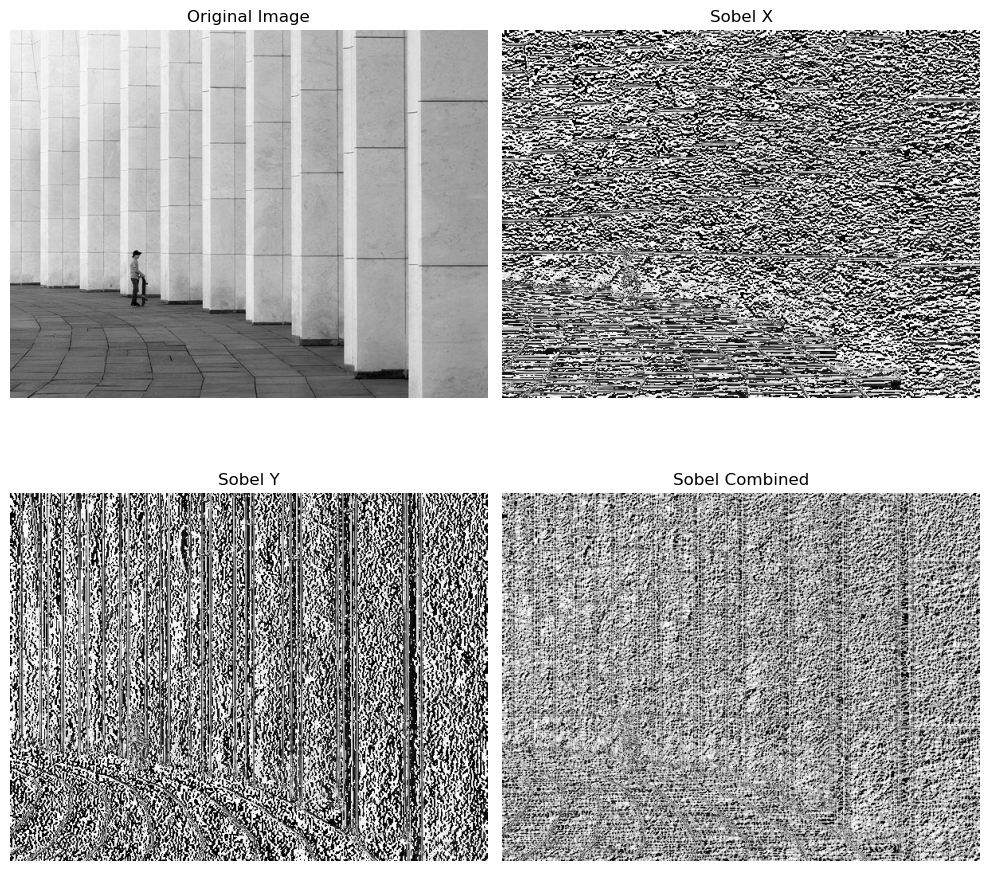

In [10]:
from scipy.ndimage import sobel

image = Image.open("Edge.jpg")
image_gray = image.convert("L")
image_array = np.array(image_gray)
sobel_x = sobel(image_array, axis=0)
sobel_y = sobel(image_array, axis=1)

sobel_combined = np.hypot(sobel_x, sobel_y)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(image_gray, cmap='gray')
axs[0, 0].set_title("Original Image")
axs[0, 0].axis("off")

axs[0, 1].imshow(sobel_x, cmap='gray')
axs[0, 1].set_title("Sobel X")
axs[0, 1].axis("off")

axs[1, 0].imshow(sobel_y, cmap='gray')
axs[1, 0].set_title("Sobel Y")
axs[1, 0].axis("off")

axs[1, 1].imshow(sobel_combined, cmap='gray')
axs[1, 1].set_title("Sobel Combined")
axs[1, 1].axis("off")

plt.tight_layout()
plt.show()

# question 3 c

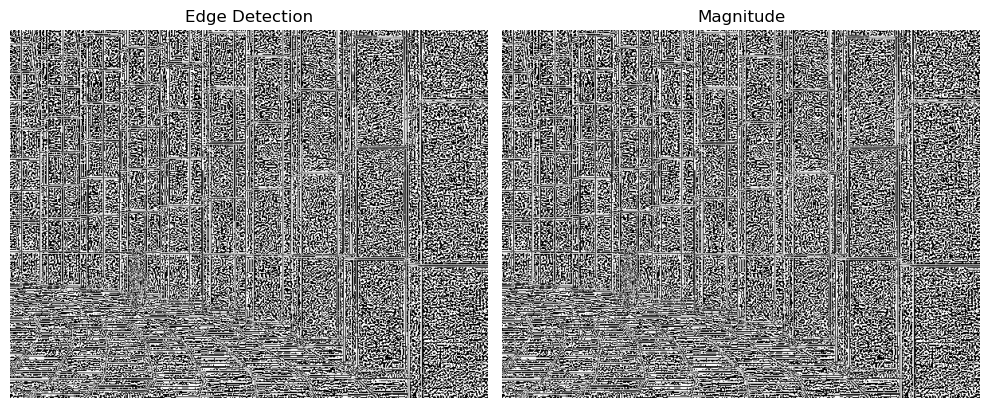

In [11]:
from scipy.ndimage import laplace

image = Image.open("Edge.jpg")
image_gray = image.convert("L")
image_array = np.array(image_gray)

laplacian = laplace(image_array)

laplacian_magnitude = np.abs(laplacian)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(laplacian, cmap='gray')
axs[0].set_title("Edge Detection")
axs[0].axis("off")

axs[1].imshow(laplacian_magnitude, cmap='gray')
axs[1].set_title("Magnitude")
axs[1].axis("off")

plt.tight_layout()
plt.show()

# question 4 a

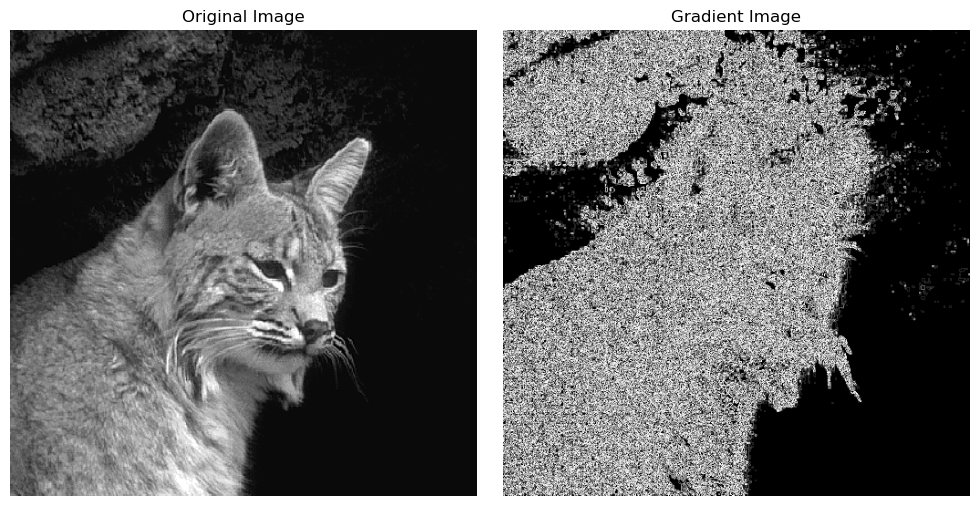

In [12]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

image = Image.open("cat.gif")

image_gray = image.convert("L")

image_array = np.array(image_gray)

kernel_x = np.array([[1, 0], [0, -1]])
kernel_y = np.array([[0, 1], [-1, 0]])

gradient_x = np.abs(convolve(image_array, kernel_x))
gradient_y = np.abs(convolve(image_array, kernel_y))
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

gradient_image = Image.fromarray(gradient_magnitude.astype(np.uint8))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(gradient_image, cmap='gray')
axes[1].set_title('Gradient Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# question 4 b

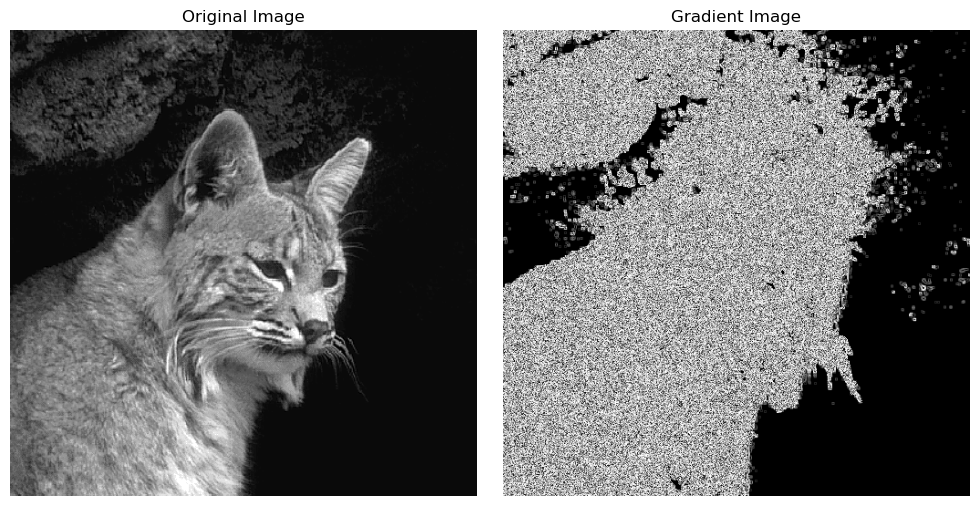

In [13]:
from scipy.ndimage import convolve

image = Image.open("cat.gif")

image_gray = image.convert("L")

image_array = np.array(image_gray)

kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

gradient_x = np.abs(convolve(image_array, kernel_x))
gradient_y = np.abs(convolve(image_array, kernel_y))
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

gradient_image = Image.fromarray(gradient_magnitude.astype(np.uint8))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(gradient_image, cmap='gray')
axes[1].set_title('Gradient Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# question4 c

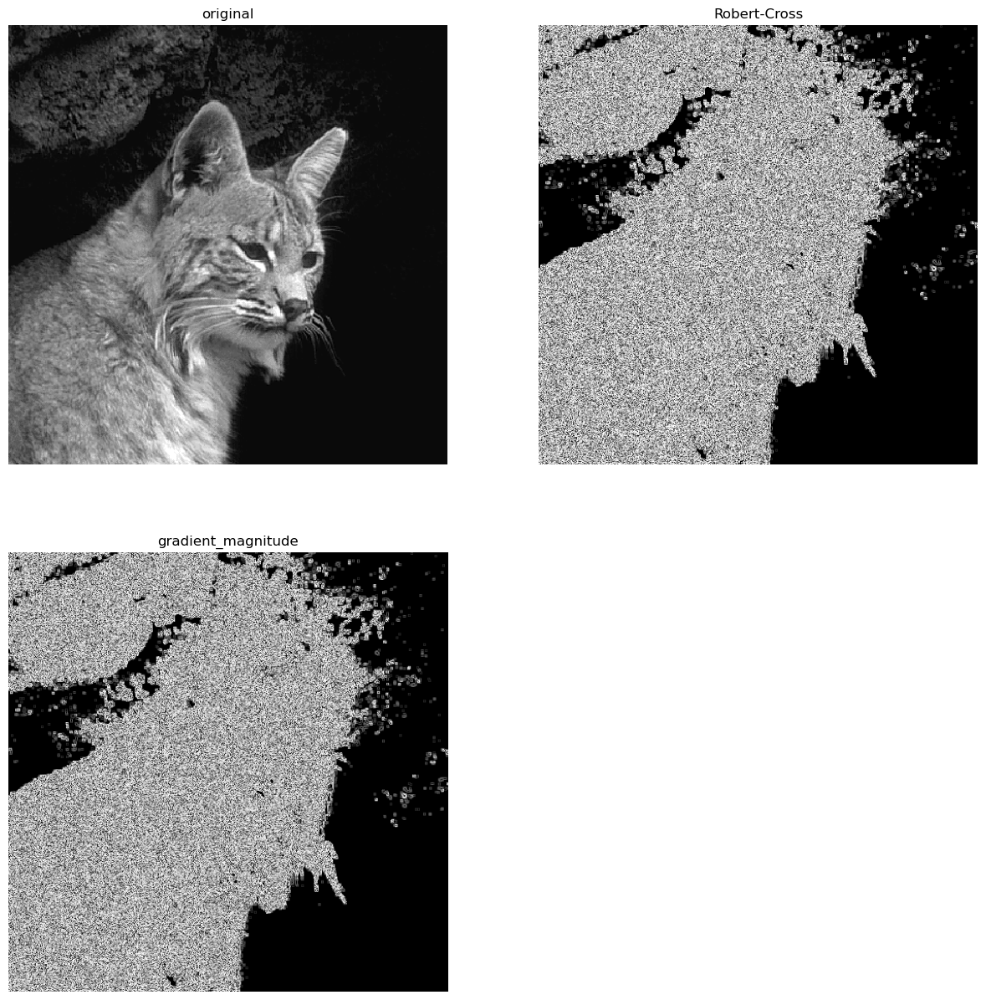

In [14]:
plot_figure([image, gradient_image, gradient_magnitude],
            [f'original', 'Robert-Cross', 'gradient_magnitude'],
            2, 2, 15, 15)

# question 4 d

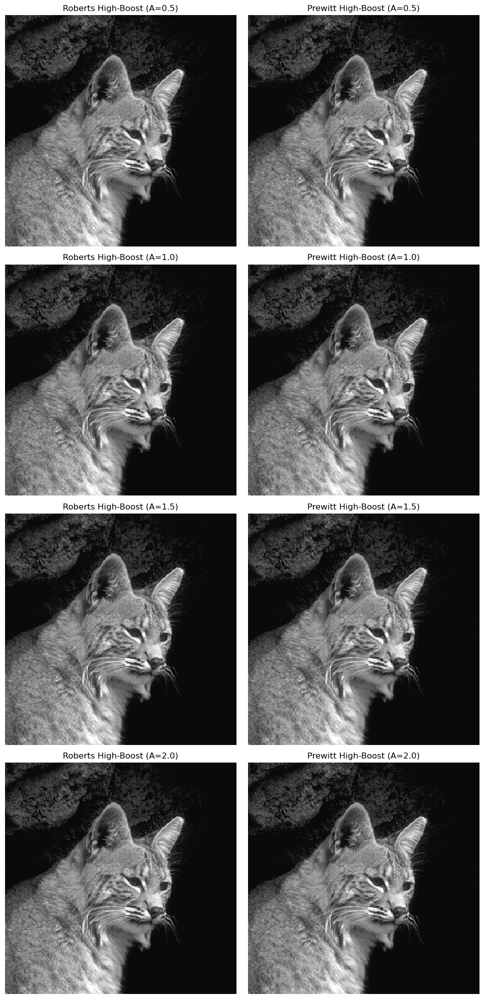

In [87]:
from scipy.ndimage import convolve

def apply_high_boost(image_array, edges, boost_factor):
    return image_array + boost_factor * (image_array - edges)

image = Image.open("cat.gif")

image_array = np.array(image)

gx_roberts = np.abs(image_array[:-1, :-1] - image_array[1:, 1:])
gy_roberts = np.abs(image_array[:-1, 1:] - image_array[1:, :-1])
gradient_magnitude_roberts = np.sqrt(gx_roberts**2 + gy_roberts**2)

gradient_magnitude_roberts = np.pad(gradient_magnitude_roberts, ((0, 1), (0, 1)), mode='constant')

edges_roberts = gradient_magnitude_roberts > 50  

kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
gx_prewitt = np.abs(convolve(image_array, kernel_x))
gy_prewitt = np.abs(convolve(image_array, kernel_y))
gradient_magnitude_prewitt = np.sqrt(gx_prewitt**2 + gy_prewitt**2)

edges_prewitt = gradient_magnitude_prewitt > 50  

boost_factors = [0.5, 1.0, 1.5, 2.0]

fig, axs = plt.subplots(len(boost_factors), 2, figsize=(10, 5 * len(boost_factors)))

for i, boost_factor in enumerate(boost_factors):
    roberts_high_boost = apply_high_boost(image_array, edges_roberts, boost_factor)

    prewitt_high_boost = apply_high_boost(image_array, edges_prewitt, boost_factor)

    axs[i, 0].imshow(roberts_high_boost, cmap='gray')
    axs[i, 0].set_title(f"Roberts High-Boost (A={boost_factor})")
    axs[i, 0].axis("off")

    axs[i, 1].imshow(prewitt_high_boost, cmap='gray')
    axs[i, 1].set_title(f"Prewitt High-Boost (A={boost_factor})")
    axs[i, 1].axis("off")

plt.tight_layout()
plt.show()

# question 5 a

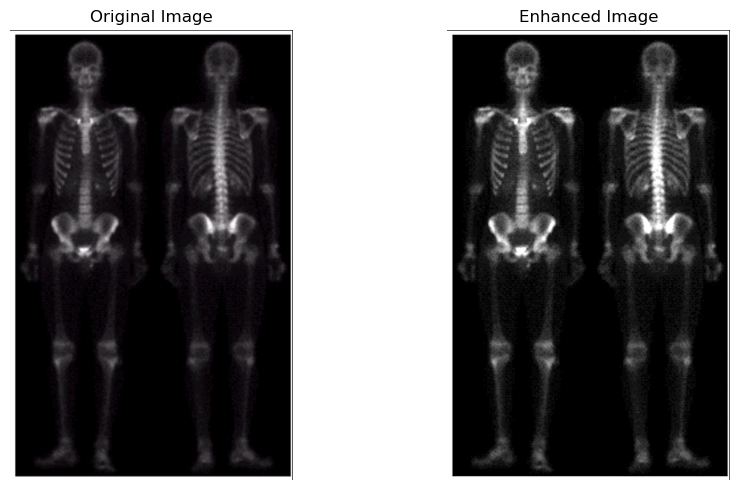

In [15]:
image = cv2.imread('skeleton.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (3, 3), 0)

laplacian = cv2.Laplacian(blurred, cv2.CV_8U)

sharpened = cv2.addWeighted(gray, 1.5, laplacian, -0.8, 0)

sharpened_bgr = cv2.cvtColor(sharpened, cv2.COLOR_GRAY2BGR)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(sharpened_bgr, cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

